# Display images

In [1]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import json

def get_sorted_image_files(directory):
    """Retrieve image file paths sorted by original prompt from metadata."""
    image_files = []
    for prompt in os.listdir(directory):
        if not prompt.startswith('.'):
            prompt_path = os.path.join(directory, prompt)
            for filename in os.listdir(prompt_path):
                if filename.endswith(('.png', '.jpg', '.jpeg')) and not filename.startswith('metadata'):
                    full_path = os.path.join(prompt_path, filename)

                    metadata_path = os.path.join(prompt_path, 'metadata', 'metadata.json')
                    if os.path.exists(metadata_path):
                        with open(metadata_path, 'r') as f:
                            metadata = json.load(f)
                            original_prompt = metadata.get('original_prompt', '')
                            image_files.append((original_prompt, full_path))
    return sorted(image_files, key=lambda x: x[0])


def display_images(paths):
    """Display images from the given list of paths with titles."""
    all_images = [get_sorted_image_files(path) for path in paths]

    n = len(all_images[0])
    m = len(all_images)

    fig, axes = plt.subplots(n, m, figsize=(15, 5 * n))

    column_titles = ['Original Prompt', 'LLM enhanced', 'Attn enhanced']
    for j in range(m):
        axes[0, j].set_title(column_titles[j], fontsize=12, pad=10)
        axes[0, j].axis('off')

    for j in range(m):
        for i in range(n):
            original_prompt, img_path = all_images[j][i]
            axes[i, j].imshow(Image.open(img_path))
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_title(original_prompt, fontsize=12, pad=5)

    plt.tight_layout()
    plt.show()

In [2]:
base_path = '../results'
paths = {}
for diff_level in ['low', 'medium', 'high']:
    paths[diff_level] = [
            os.path.join(base_path, diff_level, 'orig_prompt'),
            os.path.join(base_path, diff_level, 'refined_prompt'),
            os.path.join(base_path, diff_level, 'attn_refined_prompt'),
            ]

## Low difficulty

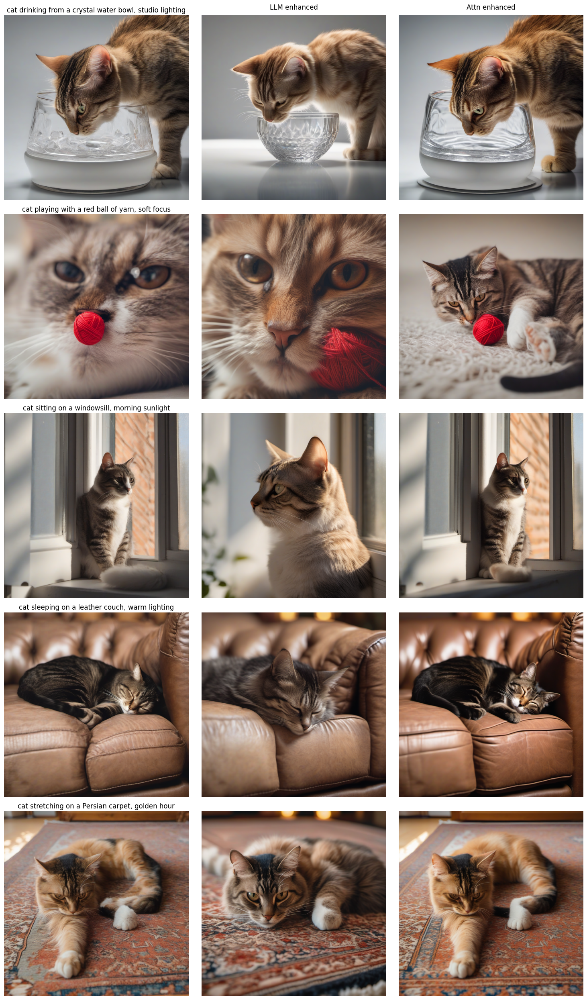

In [3]:
display_images(paths['low'])

## Medium difficulty

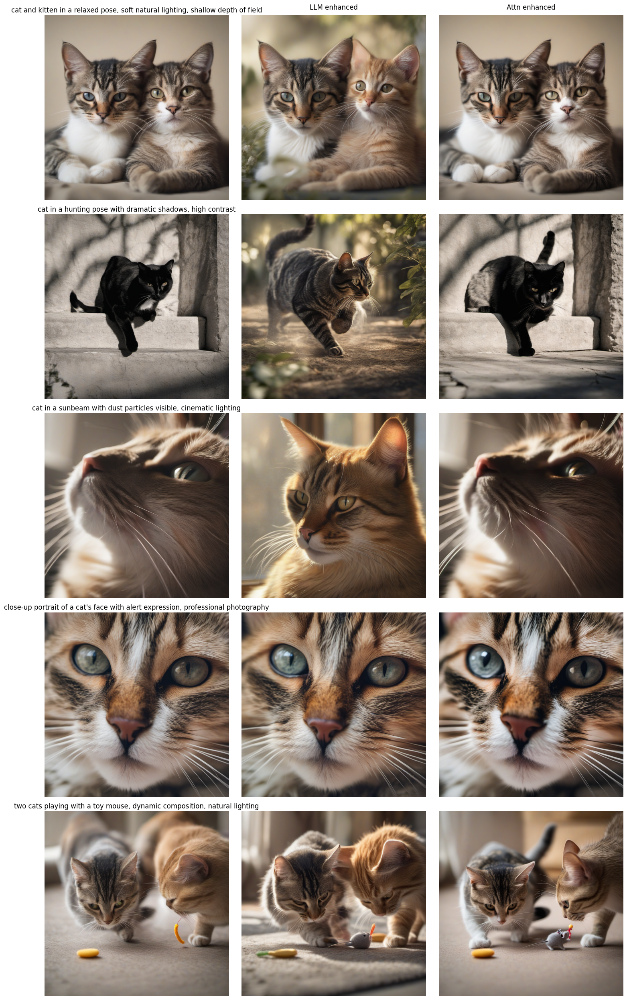

In [4]:
display_images(paths['medium'])

## High difficulty

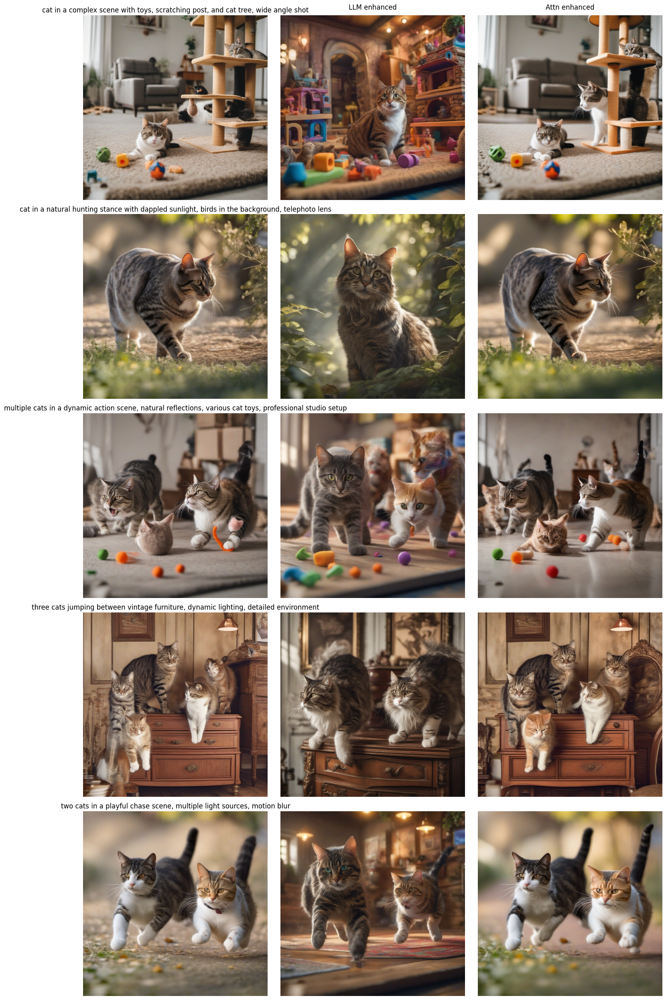

In [5]:
display_images(paths['high'])